# Step 1. 데이터셋 내려받기

In [1]:
import warnings
warnings.filterwarnings("ignore")

print("완료!")

완료!


In [2]:
import tensorflow as tf
print(tf.__version__)

2.6.0


In [3]:
import tensorflow_datasets as tfds

tfds.__version__

'4.4.0'

In [4]:
!mkdir -p ~/aiffel/Exploration_CR4/tf_flowers

In [5]:
(raw_train, raw_validation, raw_test), metadata = tfds.load(
    name='tf_flowers',
    split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
    data_dir='~/aiffel/Exploration_CR4/tf_flowers',
    download=False,
    with_info=True,
    as_supervised=True,
)

In [6]:
print(raw_train)
print(raw_validation)
print(raw_test)

<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>
<PrefetchDataset shapes: ((None, None, 3), ()), types: (tf.uint8, tf.int64)>


# Step 2. 데이터셋을 모델에 넣을 수 있는 형태로 준비하기

In [7]:
# 데이터시각화
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

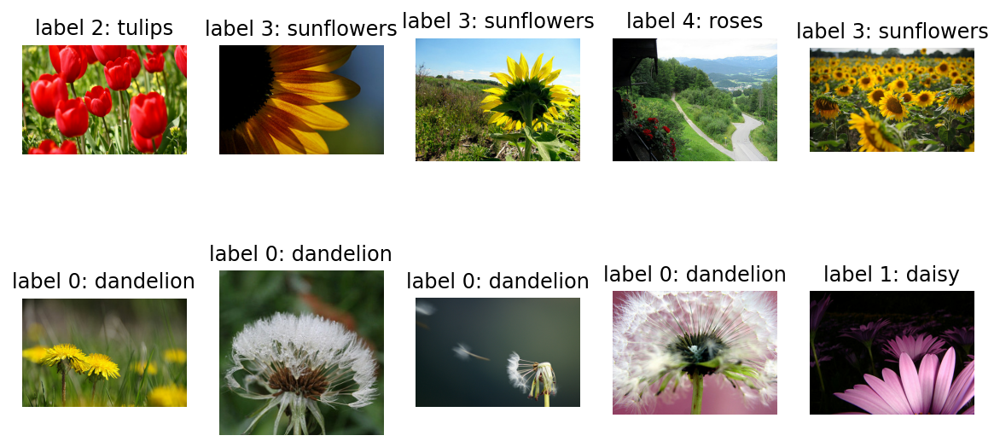

In [8]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(raw_train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

In [9]:
IMG_SIZE = 160 # 리사이징할 이미지의 크기

def format_example(image, label):
    image = tf.cast(image, tf.float32)  # image=float(image)같은 타입캐스팅의  텐서플로우 버전입니다.
    image = (image/127.5) - 1 # 픽셀값의 scale 수정
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    return image, label

In [10]:
train = raw_train.map(format_example)
validation = raw_validation.map(format_example)
test = raw_test.map(format_example)

print(train)
print(validation)
print(test)

<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>
<MapDataset shapes: ((160, 160, 3), ()), types: (tf.float32, tf.int64)>


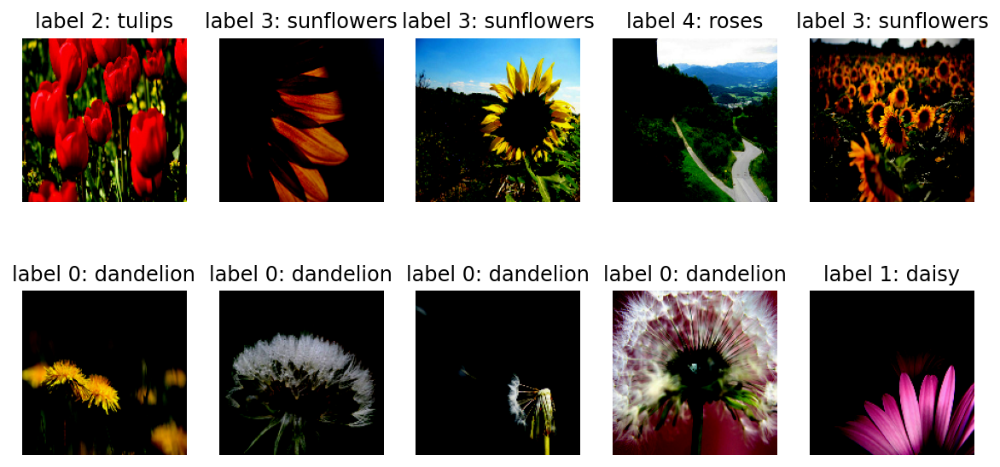

In [11]:
plt.figure(figsize=(10, 5))

get_label_name = metadata.features['label'].int2str

for idx, (image, label) in enumerate(train.take(10)):  # 10개의 데이터를 가져 옵니다.
    plt.subplot(2, 5, idx+1)
    plt.imshow(image)
    plt.title(f'label {label}: {get_label_name(label)}')
    plt.axis('off')

# Step 3. 모델 설계하기

In [12]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D

In [13]:
model = Sequential([
    Conv2D(filters=16, kernel_size=3, padding='same', activation='relu', input_shape=(160, 160, 3)),
    MaxPooling2D(),
    Conv2D(filters=32, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Conv2D(filters=64, kernel_size=3, padding='same', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(units=512, activation='relu'),
    Dense(units=5, activation='softmax')
])

In [14]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 160, 160, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 80, 80, 16)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 80, 80, 32)        4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 40, 40, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 40, 40, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 20, 20, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 25600)             0

In [15]:
learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

# Step 4. 모델 학습시키기

In [16]:
BATCH_SIZE = 32
SHUFFLE_BUFFER_SIZE = 1000

In [17]:
train_batches = train.shuffle(SHUFFLE_BUFFER_SIZE).batch(BATCH_SIZE)
validation_batches = validation.batch(BATCH_SIZE)
test_batches = test.batch(BATCH_SIZE)

In [18]:
for image_batch, label_batch in train_batches.take(1):
    break

image_batch.shape, label_batch.shape

(TensorShape([32, 160, 160, 3]), TensorShape([32]))

In [19]:
validation_steps = 20
loss0, accuracy0 = model.evaluate(validation_batches, steps=validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 0s - loss: 1.6170 - accuracy: 0.2153WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 3s 23ms/step - loss: 1.6170 - accuracy: 0.2153
initial loss: 1.62
initial accuracy: 0.22


In [20]:
EPOCHS = 10
history = model.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 6s 41ms/step - loss: 1.3699 - accuracy: 0.4166 - val_loss: 1.1368 - val_accuracy: 0.5559
Epoch 2/10
92/92 [==============================] - 3s 29ms/step - loss: 1.0798 - accuracy: 0.5671 - val_loss: 1.1058 - val_accuracy: 0.5504
Epoch 3/10
92/92 [==============================] - 3s 30ms/step - loss: 0.9715 - accuracy: 0.6168 - val_loss: 0.9729 - val_accuracy: 0.6267
Epoch 4/10
92/92 [==============================] - 3s 29ms/step - loss: 0.8689 - accuracy: 0.6703 - val_loss: 1.0688 - val_accuracy: 0.5777
Epoch 5/10
92/92 [==============================] - 3s 29ms/step - loss: 0.7825 - accuracy: 0.6982 - val_loss: 0.9135 - val_accuracy: 0.6403
Epoch 6/10
92/92 [==============================] - 3s 30ms/step - loss: 0.7011 - accuracy: 0.7435 - val_loss: 0.9115 - val_accuracy: 0.6512
Epoch 7/10
92/92 [==============================] - 3s 30ms/step - loss: 0.6217 - accuracy: 0.7793 - val_loss: 0.9781 - val_accuracy: 0.6540
Epoch 8/10
92

# Step 5. 모델 성능 평가하기

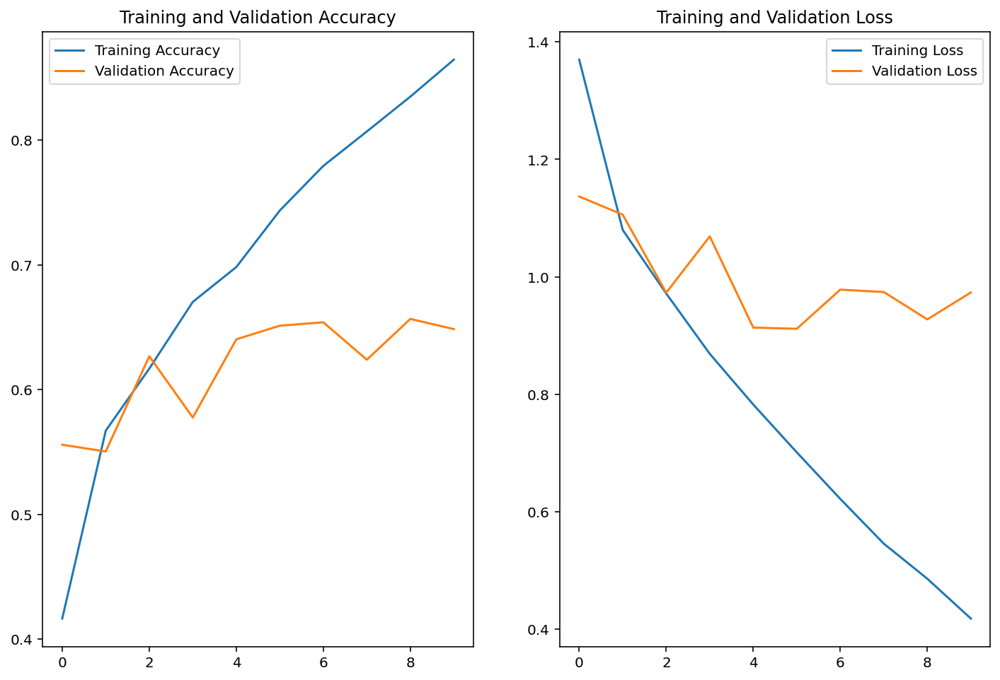

In [21]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

In [22]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    break

predictions

array([[6.23420589e-02, 5.00650890e-03, 2.46072382e-01, 3.92987520e-01,
        2.93591499e-01],
       [7.81079948e-01, 2.16829002e-01, 1.63100334e-03, 3.40973493e-05,
        4.26020793e-04],
       [2.81200320e-01, 2.04333272e-02, 4.87358540e-01, 2.09100023e-01,
        1.90780812e-03],
       [7.15557411e-02, 1.12633489e-01, 4.33657855e-01, 8.63184687e-03,
        3.73521090e-01],
       [7.35460997e-01, 1.47681028e-01, 3.36131416e-02, 5.57052623e-03,
        7.76742697e-02],
       [2.19691738e-01, 3.72595906e-01, 4.45039086e-02, 2.89535131e-02,
        3.34254950e-01],
       [2.75703217e-03, 3.46472897e-02, 9.46038544e-01, 7.16336013e-04,
        1.58408210e-02],
       [6.82878733e-01, 4.79466990e-02, 1.62922770e-01, 3.51717211e-02,
        7.10801408e-02],
       [1.30663700e-02, 5.40816072e-05, 2.43413467e-02, 9.62459147e-01,
        7.91359053e-05],
       [9.73825514e-01, 2.46760566e-02, 4.69473365e-04, 1.18257973e-04,
        9.10762174e-04],
       [9.93825316e-01, 3.7009

In [23]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([3, 0, 2, 2, 0, 1, 2, 0, 3, 0, 0, 3, 3, 4, 0, 3, 2, 3, 0, 2, 2, 0,
       1, 0, 0, 2, 4, 0, 2, 1, 0, 0])

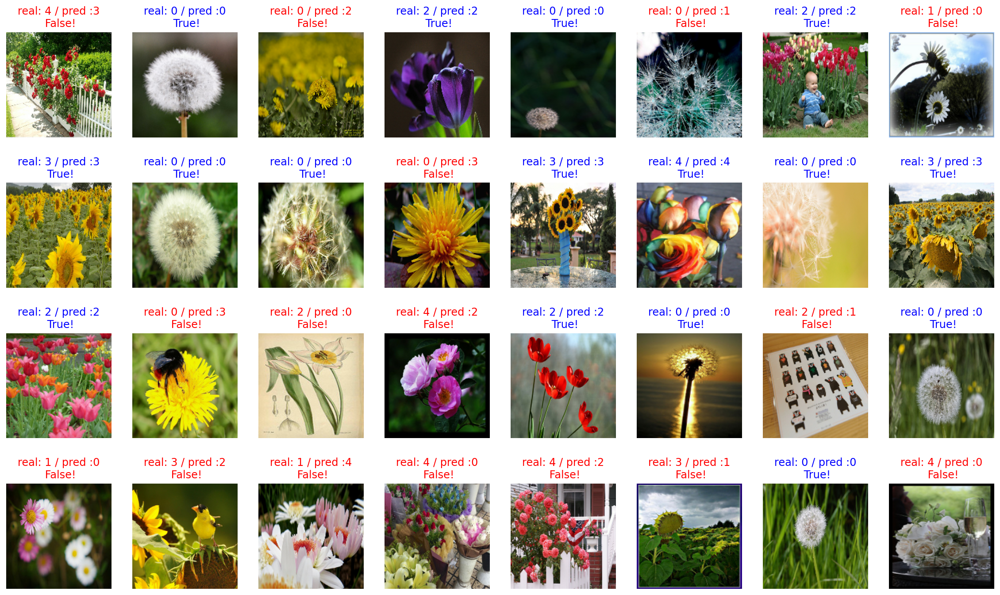

In [24]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [25]:
count = 0   # 정답을 맞춘 개수
for image, label, prediction in zip(images, labels, predictions):
    # [[YOUR CODE]]
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100)

50.0


# Step 4. 모델 학습시키기 - Transter Learning

In [26]:
IMG_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

# Create the base model from the pre-trained model VGG16
base_model = tf.keras.applications.VGG16(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')

In [27]:
image_batch.shape

TensorShape([32, 160, 160, 3])

In [28]:
feature_batch = base_model(image_batch)
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [29]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 160, 160, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 160, 160, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 160, 160, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 80, 80, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 80, 80, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 80, 80, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 40, 40, 128)       0     

In [30]:
feature_batch.shape

TensorShape([32, 5, 5, 512])

In [31]:
# Global Average Pooling 계층을 만들기.
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()

In [32]:
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 512)


In [33]:
dense_layer1 = Dense(units=512, activation='relu')
dense_layer = Dense(units=52, activation='relu')
prediction_layer = Dense(units=5, activation='softmax')

# feature_batch_averag가 dense_layer를 거친 결과가 다시 prediction_layer를 거치게 되면
prediction_batch = prediction_layer(dense_layer(feature_batch_average))  
print(prediction_batch.shape)

(32, 5)


In [34]:
base_model.trainable = False

In [35]:
model_vgg16 = tf.keras.Sequential([
  base_model,
  global_average_layer,
  dense_layer1,
  dense_layer,  
  prediction_layer
])

In [36]:
model_vgg16.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 5, 5, 512)         14714688  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
dense_3 (Dense)              (None, 52)                26676     
_________________________________________________________________
dense_4 (Dense)              (None, 5)                 265       
Total params: 15,004,285
Trainable params: 289,597
Non-trainable params: 14,714,688
_________________________________________________________________


In [37]:
base_learning_rate = 0.0001
model_vgg16.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=base_learning_rate),
              loss=tf.keras.losses.sparse_categorical_crossentropy,
              metrics=['accuracy'])

In [38]:
validation_steps=20
loss0, accuracy0 = model_vgg16.evaluate(validation_batches, steps = validation_steps)

print("initial loss: {:.2f}".format(loss0))
print("initial accuracy: {:.2f}".format(accuracy0))

12/20 [=================>............] - ETA: 1s - loss: 1.8175 - accuracy: 0.1662WARNING:tensorflow:Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches (in this case, 20 batches). You may need to use the repeat() function when building your dataset.


20/20 [==============================] - 7s 141ms/step - loss: 1.8175 - accuracy: 0.1662
initial loss: 1.82
initial accuracy: 0.17


In [39]:
EPOCHS = 10   # 이번에는 이전보다 훨씬 빠르게 수렴되므로 5Epoch이면 충분합니다.
history_vgg16 = model_vgg16.fit(train_batches,
                    epochs=EPOCHS,
                    validation_data=validation_batches)

Epoch 1/10
92/92 [==============================] - 11s 111ms/step - loss: 1.3312 - accuracy: 0.5174 - val_loss: 1.0744 - val_accuracy: 0.7003
Epoch 2/10
92/92 [==============================] - 8s 81ms/step - loss: 0.9697 - accuracy: 0.7156 - val_loss: 0.8389 - val_accuracy: 0.7084
Epoch 3/10
92/92 [==============================] - 8s 81ms/step - loss: 0.7954 - accuracy: 0.7480 - val_loss: 0.7356 - val_accuracy: 0.7548
Epoch 4/10
92/92 [==============================] - 8s 81ms/step - loss: 0.6956 - accuracy: 0.7766 - val_loss: 0.6660 - val_accuracy: 0.7766
Epoch 5/10
92/92 [==============================] - 8s 81ms/step - loss: 0.6270 - accuracy: 0.7943 - val_loss: 0.6317 - val_accuracy: 0.7684
Epoch 6/10
92/92 [==============================] - 8s 81ms/step - loss: 0.5813 - accuracy: 0.8089 - val_loss: 0.5944 - val_accuracy: 0.7875
Epoch 7/10
92/92 [==============================] - 8s 81ms/step - loss: 0.5480 - accuracy: 0.8195 - val_loss: 0.5763 - val_accuracy: 0.7984
Epoch 8/10


# Step 5. 모델 성능 평가하기 - Transfer Learning

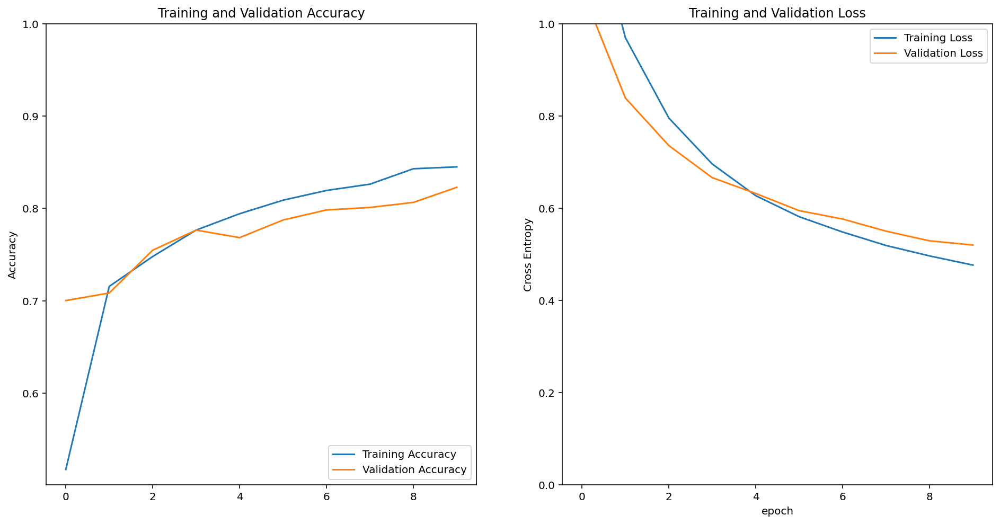

In [40]:
acc = history_vgg16.history['accuracy']
val_acc = history_vgg16.history['val_accuracy']

loss = history_vgg16.history['loss']
val_loss = history_vgg16.history['val_loss']

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [41]:
for image_batch, label_batch in test_batches.take(1):
    images = image_batch
    labels = label_batch
    predictions = model.predict(image_batch)
    pass

predictions

array([[6.23420589e-02, 5.00650890e-03, 2.46072382e-01, 3.92987520e-01,
        2.93591499e-01],
       [7.81079948e-01, 2.16829002e-01, 1.63100334e-03, 3.40973493e-05,
        4.26020793e-04],
       [2.81200320e-01, 2.04333272e-02, 4.87358540e-01, 2.09100023e-01,
        1.90780812e-03],
       [7.15557411e-02, 1.12633489e-01, 4.33657855e-01, 8.63184687e-03,
        3.73521090e-01],
       [7.35460997e-01, 1.47681028e-01, 3.36131416e-02, 5.57052623e-03,
        7.76742697e-02],
       [2.19691738e-01, 3.72595906e-01, 4.45039086e-02, 2.89535131e-02,
        3.34254950e-01],
       [2.75703217e-03, 3.46472897e-02, 9.46038544e-01, 7.16336013e-04,
        1.58408210e-02],
       [6.82878733e-01, 4.79466990e-02, 1.62922770e-01, 3.51717211e-02,
        7.10801408e-02],
       [1.30663700e-02, 5.40816072e-05, 2.43413467e-02, 9.62459147e-01,
        7.91359053e-05],
       [9.73825514e-01, 2.46760566e-02, 4.69473365e-04, 1.18257973e-04,
        9.10762174e-04],
       [9.93825316e-01, 3.7009

In [42]:
import numpy as np
predictions = np.argmax(predictions, axis=1)
predictions

array([3, 0, 2, 2, 0, 1, 2, 0, 3, 0, 0, 3, 3, 4, 0, 3, 2, 3, 0, 2, 2, 0,
       1, 0, 0, 2, 4, 0, 2, 1, 0, 0])

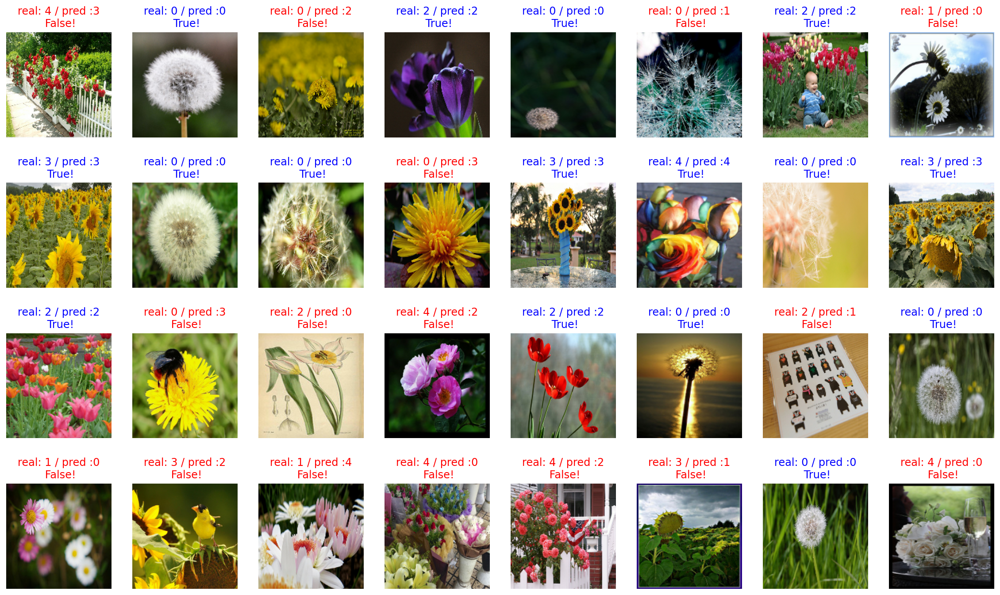

In [43]:
plt.figure(figsize=(20, 12))

for idx, (image, label, prediction) in enumerate(zip(images, labels, predictions)):
    plt.subplot(4, 8, idx+1)
    image = (image + 1) / 2
    plt.imshow(image)
    correct = label == prediction
    title = f'real: {label} / pred :{prediction}\n {correct}!'
    if not correct:
        plt.title(title, fontdict={'color': 'red'})
    else:
        plt.title(title, fontdict={'color': 'blue'})
    plt.axis('off')

In [44]:
count = 0
for image, label, prediction in zip(images, labels, predictions):
    correct = label == prediction
    if correct:
        count = count + 1

print(count / 32 * 100) # 약 95% 내외

50.0


# Step 6. 모델 활용하기

In [45]:
import os
img_dir_path = os.getenv("HOME") + "/aiffel/Exploration_CR4/tf_flowers/images"
os.path.exists(img_dir_path)

True

In [46]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [47]:
# image를 load & arrary로 변환(reshape) & predict & percentage

def show_and_predict_image(dirpath, filename, img_size=160):
    filepath = os.path.join(dirpath, filename)
    image = load_img(filepath, target_size=(img_size, img_size))
    plt.imshow(image)
    plt.axis('off')
    image = img_to_array(image).reshape(1, img_size, img_size, 3)
    predictions = (model_vgg16.predict(image)[0])
    prediction_idx = np.argmax((model_vgg16.predict(image)[0]))
    
    flower_lists = metadata.features['label'].names
   
    print(f"This image seems {flower_lists[prediction_idx]} with {np.max(predictions) * 100}%.")

This image seems daisy with 100.0%.


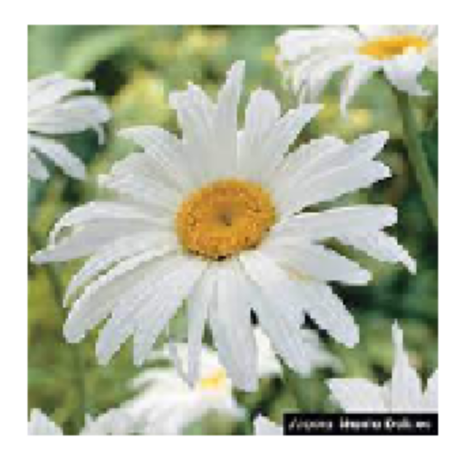

In [48]:
filename = 'daisy.jfif'
show_and_predict_image(img_dir_path, filename)

This image seems dandelion with 64.13175463676453%.


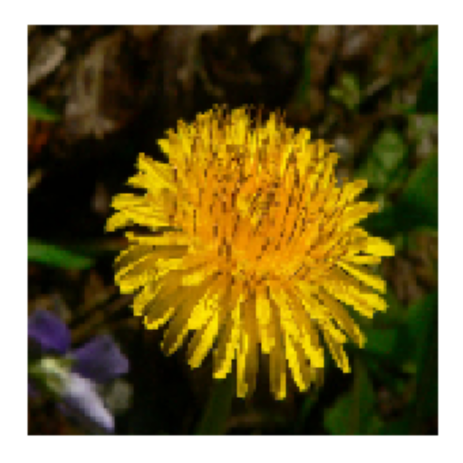

In [49]:
filename = 'dandelion.jpg'
show_and_predict_image(img_dir_path, filename)

This image seems roses with 100.0%.


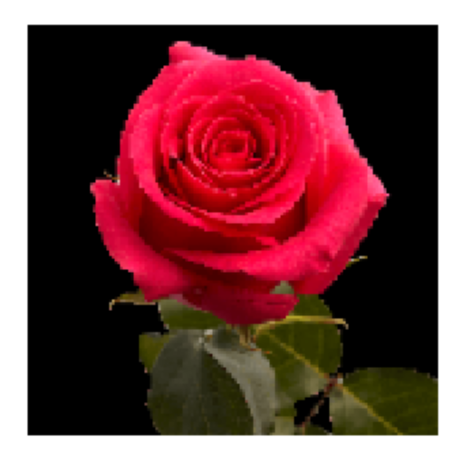

In [50]:
filename = 'roses.png'
show_and_predict_image(img_dir_path, filename)

This image seems sunflowers with 100.0%.


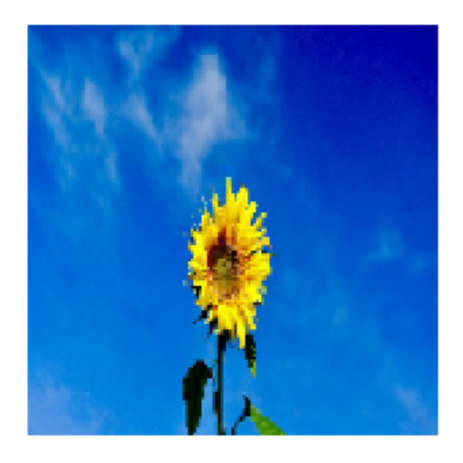

In [51]:
filename = 'sunflowers.jpg'
show_and_predict_image(img_dir_path, filename)